In [5]:
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.decomposition import PCA
pd.set_option('display.max_columns', None)
pd.set_option('float_format', '{:f}'.format)

from datetime import datetime, timedelta
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as pyoff
import plotly.graph_objs as go

import warnings
warnings.filterwarnings('ignore')

In [158]:
pyoff.init_notebook_mode(connected=True)
from plotly.offline import iplot

In [7]:
pd.set_option('display.max_colwidth',-1)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns',500)

In [8]:
import os
os.getcwd()

'C:\\Users\\RUPA\\Desktop\\MFCS CAPSTONE'

In [9]:
df = pd.read_csv('final_merged_data.csv')

In [10]:
df.head()

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,0,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P001,1203.140000,73.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
1,1,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P002,2348.750000,6.500000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
2,2,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P010,500.060000,1.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
3,3,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P001,804.260000,170.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x
4,4,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P011,197.030000,1.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x


In [11]:
df['service_time_hours'].describe()

count   936275.000000
mean    89.878783    
std     275.095916   
min     -0.009000    
25%     4.049000     
50%     23.259000    
75%     73.230000    
max     17769.261000 
Name: service_time_hours, dtype: float64

In [12]:
df[df['service_time_hours']<0]

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
714423,714423,Retail,182085,00:00:00,7167000988,363294,62001,0.000000,MARUTI,0.000000,SWIFT DZIRE,0.000000,Running Repairs,0.000000,603103,X085,X085 - SRI MOTORS,NO,0.000000,TN19M6594,0,X085SA1,2016-05-02 15:12:11,2016-05-02 15:12:44,-1 days +23:59:27.000000000,2016,5,Kanchipuram,Tamil Nadu,"Pudupakkam, Padur, Kelambakkam, Thaiyur",12.919400,79.977700,NaN,nan,NaN,363294.000000,G2TX,0.000000,0.000000,0.000000,0.000000,6,50000 - 100000,-0.009000,-0.000000,0.000000,Unprofitable,0,z


In [13]:
df.drop(index=714423,axis=0,inplace=True)

In [14]:
df[df['service_time_hours']<0]

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory


In [15]:
df['service_time_hours'].describe()

count   936274.000000
mean    89.878879    
std     275.096047   
min     0.010000     
25%     4.049000     
50%     23.259000    
75%     73.230000    
max     17769.261000 
Name: service_time_hours, dtype: float64

### Clustering 

In [16]:
df.head()

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,0,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P001,1203.140000,73.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
1,1,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P002,2348.750000,6.500000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
2,2,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P010,500.060000,1.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
3,3,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P001,804.260000,170.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x
4,4,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P011,197.030000,1.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x


In [17]:
df[df['Cust Type']=='Insurance']

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
61202,61202,Insurance,EMA120,00:00:00,7022200615,207094,46431,950.030000,MARUTI,200.010000,ALTO,0.000000,Running Repairs,3085.450000,400051,BC18,COIMBATORE,NO,0.000000,TN09AY5032,4235,BC18SA1,2015-04-23 17:53:04,2015-04-21 17:16:11,2 days 00:36:53.000000000,2015,4,Mumbai,Maharashtra,"B.N. Bhavan, Kherwadi, Bandra(East), Audit Bhavan",19.058700,72.846300,EMA120,1.000000,Z005,207094.000000,P001,950.030000,132.000000,7520.950000,4235.490000,4,20000 - 50000,48.615000,2.000000,0.308000,Unprofitable,3,x
61203,61203,Insurance,EMA120,00:00:00,7022200615,207094,46431,950.030000,MARUTI,200.010000,ALTO,0.000000,Running Repairs,3085.450000,400051,BC18,COIMBATORE,NO,0.000000,TN09AY5032,4235,BC18SA1,2015-04-23 17:53:04,2015-04-21 17:16:11,2 days 00:36:53.000000000,2015,4,Mumbai,Maharashtra,"B.N. Bhavan, Kherwadi, Bandra(East), Audit Bhavan",19.058700,72.846300,EMA120,1.000000,Z005,207094.000000,P002,3085.450000,11.500000,7520.950000,4235.490000,4,20000 - 50000,48.615000,2.000000,0.308000,Unprofitable,3,x
61204,61204,Insurance,EMA120,00:00:00,7022200615,207094,46431,950.030000,MARUTI,200.010000,ALTO,0.000000,Running Repairs,3085.450000,400051,BC18,COIMBATORE,NO,0.000000,TN09AY5032,4235,BC18SA1,2015-04-23 17:53:04,2015-04-21 17:16:11,2 days 00:36:53.000000000,2015,4,Mumbai,Maharashtra,"B.N. Bhavan, Kherwadi, Bandra(East), Audit Bhavan",19.058700,72.846300,EMA120,1.000000,Z005,207094.000000,P011,200.010000,1.000000,7520.950000,4235.490000,4,20000 - 50000,48.615000,2.000000,0.308000,Unprofitable,3,x


In [18]:
#### Selecting columns required for clustering

cluster_df = df[['Cust Type','Customer No.','Make','Model','Order Type','Clean_CITY','Clean_Location_Area','Invoice No','service_time_hours','Total Amt Wtd Tax.','Net value']]

In [19]:
cluster_df.isnull().sum()

Cust Type              0    
Customer No.           0    
Make                   0    
Model                  3185 
Order Type             0    
Clean_CITY             94162
Clean_Location_Area    94162
Invoice No             0    
service_time_hours     0    
Total Amt Wtd Tax.     0    
Net value              39   
dtype: int64

In [20]:
cluster_df.shape

(936274, 11)

In [21]:
cluster_df = cluster_df[cluster_df['Model'].notnull()]
cluster_df = cluster_df[cluster_df['Clean_CITY'].notnull()]
cluster_df = cluster_df[cluster_df['Clean_Location_Area'].notnull()]
cluster_df = cluster_df[cluster_df['Net value'].notnull()]

In [22]:
cluster_df.shape

(839153, 11)

In [23]:
cluster_df.isnull().sum()

Cust Type              0
Customer No.           0
Make                   0
Model                  0
Order Type             0
Clean_CITY             0
Clean_Location_Area    0
Invoice No             0
service_time_hours     0
Total Amt Wtd Tax.     0
Net value              0
dtype: int64

In [24]:
cluster_df.head()

,Cust Type,Customer No.,Make,Model,Order Type,Clean_CITY,Clean_Location_Area,Invoice No,service_time_hours,Total Amt Wtd Tax.,Net value
0,Retail,67849,GENERAL MOTORS,SPARK,Paid Service,Thane,"Thane Bazar, Thane H.O, Thane R.S.",7005200002,477.015000,4051,1203.140000
1,Retail,67849,GENERAL MOTORS,SPARK,Paid Service,Thane,"Thane Bazar, Thane H.O, Thane R.S.",7005200002,477.015000,4051,2348.750000
2,Retail,67849,GENERAL MOTORS,SPARK,Paid Service,Thane,"Thane Bazar, Thane H.O, Thane R.S.",7005200002,477.015000,4051,500.060000
3,Retail,84419,TATA,INDICA,SMC Value Package,Thane,"Thane East, Kopri Colony",7005200003,19.921000,1001,804.260000
4,Retail,84419,TATA,INDICA,SMC Value Package,Thane,"Thane East, Kopri Colony",7005200003,19.921000,1001,197.030000


### Selecting columns required for clustering

In [25]:
clusters = cluster_df.groupby(['Customer No.','Cust Type','Make','Model','Clean_CITY','Order Type']).agg(
                                {
                                 'Invoice No':'nunique',
                                 'Net value':'sum',
                                 'service_time_hours':'mean'
                                }
                            )

In [26]:
clusters.head()

Invoice No  \
Customer No. Cust Type Make           Model   Clean_CITY Order Type                    
1            Retail    MARUTI         KIZASHI Pune       Paid Service     1            
                                      OMNI    Pune       Paid Service     2            
                                                         Running Repairs  1            
10           Retail    GENERAL MOTORS OPTRA   Mumbai     Paid Service     4            
                                                         Running Repairs  1            

                                                                            Net value  \
Customer No. Cust Type Make           Model   Clean_CITY Order Type                     
1            Retail    MARUTI         KIZASHI Pune       Paid Service    0.000000       
                                      OMNI    Pune       Paid Service    0.000000       
                                                         Running Repairs 0.000000       
10           Retail    GENERAL MOTORS OPTRA   Mumbai     Paid Service    10505.720000   
                                                         Running Repairs 599.840000     

                                                                          service_time_hours  
Customer No. Cust Type Make           Model   Clean_CITY Order Type                           
1            Retail    MARUTI         KIZASHI Pune       Paid Service    901.082000           
                                      OMNI    Pune       Paid Service    2674.040000          
                                                         Running Repairs 321.366000           
10           Retail    GENERAL MOTORS OPTRA   Mumbai     Paid Service    20.744200            
                                                         Running Repairs 3.071000

In [27]:
clusters.columns

Index(['Invoice No', 'Net value', 'service_time_hours'], dtype='object')

In [28]:
clusters.columns =['Total Invoices','Total Revenue','Total Servicing Hrs']

In [29]:
clusters = clusters.reset_index()

In [30]:
clusters.shape

(310983, 9)

### Cluster Analysis

#### Separating customers with zero revenue

In [31]:
zero_spenders = clusters[clusters['Total Revenue']<=0]

In [32]:
zero_spenders.shape

(26327, 9)

In [33]:
zero_spenders['Clusters'] = 'zero_spenders'

In [34]:
zero_spenders.head()

,Customer No.,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs,Clusters
0,1,Retail,MARUTI,KIZASHI,Pune,Paid Service,1,0.000000,901.082000,zero_spenders
1,1,Retail,MARUTI,OMNI,Pune,Paid Service,2,0.000000,2674.040000,zero_spenders
2,1,Retail,MARUTI,OMNI,Pune,Running Repairs,1,0.000000,321.366000,zero_spenders
10,10000,Retail,MARUTI,WAGONR,Hyderabad,SMC Redemption,2,0.000000,1.629500,zero_spenders
16,100002,Retail,FORD,FIGO,Panchkula,Running Repairs,1,0.000000,0.113000,zero_spenders


#### Separating customers with non zero spends

In [35]:
non_zero = clusters[clusters['Total Revenue']>0]

In [36]:
non_zero.shape

(284656, 9)

In [37]:
print("0.05 quantile :-",non_zero['Total Revenue'].quantile(0.05))
print("0.25 quantile :-",non_zero['Total Revenue'].quantile(0.25))
print("0.50 quantile :-",non_zero['Total Revenue'].quantile(0.50))
print("0.75 quantile :-",non_zero['Total Revenue'].quantile(0.75))
print("0.95 quantile :-",non_zero['Total Revenue'].quantile(0.95))
print("minimum total revenue :-",non_zero['Total Revenue'].min())
print("maximum total revenue :-",non_zero['Total Revenue'].max())
print("mean total revenue :-",non_zero['Total Revenue'].mean())

0.05 quantile :- 148.58
0.25 quantile :- 696.8774999999998
0.50 quantile :- 2600.5
0.75 quantile :- 6875.282499999999
0.95 quantile :- 25853.585
minimum total revenue :- 0.01
maximum total revenue :- 3852506.8100000084
mean total revenue :- 6912.321603901306


In [38]:
print("0.05 quantile :-",non_zero['Total Servicing Hrs'].quantile(0.05))
print("0.25 quantile :-",non_zero['Total Servicing Hrs'].quantile(0.25))
print("0.50 quantile :-",non_zero['Total Servicing Hrs'].quantile(0.50))
print("0.75 quantile :-",non_zero['Total Servicing Hrs'].quantile(0.75))
print("0.95 quantile :-",non_zero['Total Servicing Hrs'].quantile(0.95))
print("mimimum servicing time in hrs :-",non_zero['Total Servicing Hrs'].min())
print("maximum servicing time in hrs :-",non_zero['Total Servicing Hrs'].max())
print("mean servicing time in hrs :-",non_zero['Total Servicing Hrs'].mean())

0.05 quantile :- 0.231
0.25 quantile :- 3.383
0.50 quantile :- 21.0295
0.75 quantile :- 72.82124999999999
0.95 quantile :- 387.24437499999993
mimimum servicing time in hrs :- 0.01
maximum servicing time in hrs :- 17453.071
mean servicing time in hrs :- 91.23086560333967


### Rule Based Clustering based on avg revenue

#### Rule based clustering is performed based on quantile analysis of total revenue column

In [39]:
# Low revenue customers (less than 0.50 quantile)
low_revenue = non_zero[(non_zero['Total Revenue']< non_zero['Total Revenue'].quantile(0.50))]

# Medium revenue customers (between 0.50 to 0.75 quantile)
medium_revenue = non_zero[
                            (non_zero['Total Revenue'] > non_zero['Total Revenue'].quantile(0.50)) & 
                            (non_zero['Total Revenue']< non_zero['Total Revenue'].quantile(0.75))
                         ]

# Average revenue customers (between 0.75 to 0.95 quantile)
avg_revenue = non_zero[
                        (non_zero['Total Revenue'] > non_zero['Total Revenue'].quantile(0.75)) & 
                        (non_zero['Total Revenue'] < non_zero['Total Revenue'].quantile(0.95))
                      ]

# High revenue customers (moe than 0.95 quantile)
high_revenue = non_zero[
                        (non_zero['Total Revenue'] > non_zero['Total Revenue'].quantile(0.95))
                       ]

In [40]:
print(low_revenue.shape)
print(medium_revenue.shape)
print(avg_revenue.shape)
print(high_revenue.shape)

(142326, 9)
(71163, 9)
(56931, 9)
(14233, 9)


In [41]:
# Naming the clusters
low_revenue['Clusters'] = 'low_revenue'
medium_revenue['Clusters'] = 'medium_revenue'
avg_revenue['Clusters'] = 'avg_revenue'
high_revenue['Clusters'] = 'high_revenue'

In [42]:
revenue_clust = pd.concat([low_revenue,medium_revenue,avg_revenue,high_revenue],axis=0)

In [43]:
revenue_clust.groupby(['Clusters']).agg({'Total Revenue':'mean','Total Servicing Hrs':'mean','Customer No.':'count'}).sort_values('Total Revenue',ascending=False)

,Total Revenue,Total Servicing Hrs,Customer No.
Clusters,,,
high_revenue,56448.374909,349.862939,14233
avg_revenue,12768.362427,133.725733,56931
medium_revenue,4312.884887,76.767075,71163
low_revenue,915.945283,55.597662,142326


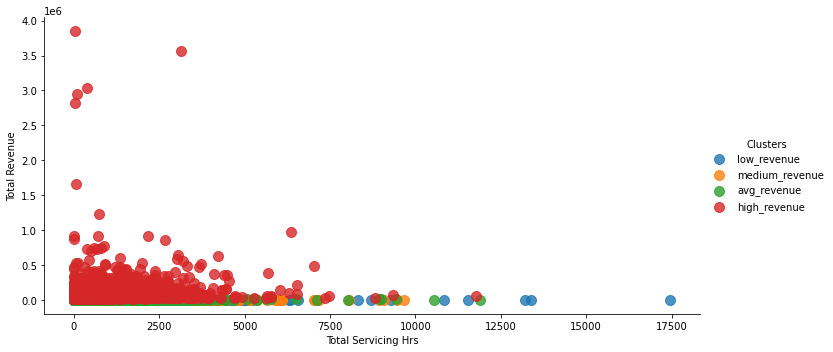

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
# import plotly.express as px

# fig = px.scatter(revenue_clust, x = 'Total Servicing Hrs', y = "Total Revenue", color = 'Clusters')
    
# fig.update_layout(title = 'Scatterplot of Total Servicing Hrs and Total Revenue',
#                   xaxis_title = 'Total Servicing Hrs',
#                   yaxis_title = 'Total Revenue')
    
# fig.show()
sns.lmplot(data=revenue_clust,x='Total Servicing Hrs', y='Total Revenue', hue='Clusters', fit_reg=False, legend=True, legend_out=True,size=5,aspect=2,scatter_kws={"s": 100})


### Rule Based Clustering based on avg servicing time

In [45]:
# super fast service (less than 0.50 quantile)
super_fast = non_zero[non_zero['Total Servicing Hrs']< non_zero['Total Servicing Hrs'].quantile(0.50)]

# fast service (between 0.50 to 0.75 quantile)
fast = non_zero[
                (non_zero['Total Servicing Hrs']> non_zero['Total Servicing Hrs'].quantile(0.50)) & 
                (non_zero['Total Servicing Hrs']< non_zero['Total Servicing Hrs'].quantile(0.75))
                ]

# slow service (between 0.75 to 0.95 quantile)
slow = non_zero[
                (non_zero['Total Servicing Hrs'] > non_zero['Total Servicing Hrs'].quantile(0.75)) & 
                (non_zero['Total Servicing Hrs'] < non_zero['Total Servicing Hrs'].quantile(0.95))
                ]

# super fast service (more than 0.95 quantile)
super_slow = non_zero[
                        non_zero['Total Servicing Hrs'] > non_zero['Total Servicing Hrs'].quantile(0.95)
                     ]


In [46]:
print(super_fast.shape)
print(fast.shape)
print(slow.shape)
print(super_slow.shape)

(142328, 9)
(71164, 9)
(56931, 9)
(14233, 9)


In [47]:
super_fast['Clusters'] = 'super_fast'
fast['Clusters'] = 'fast'
slow['Clusters'] = 'slow'
super_slow['Clusters'] = 'super_slow'

In [48]:
f_clust = pd.concat([super_fast,fast,slow,super_slow],axis=0)
f_clust

,Customer No.,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs,Clusters
3,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Paid Service,4,10505.720000,20.744200,super_fast
4,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Running Repairs,1,599.840000,3.071000,super_fast
7,1000,Retail,MARUTI,ALTO,Pune,Paid Service,4,7617.270000,5.224600,super_fast
8,1000,Retail,MARUTI,ALTO,Pune,Running Repairs,2,1196.170000,5.319500,super_fast
9,10000,Retail,MARUTI,WAGONR,Hyderabad,Running Repairs,4,734.230000,10.841000,super_fast
...,...,...,...,...,...,...,...,...,...,...
310944,MFM15,Retail,MAHINDRA,XYLO,Hyderabad,Paid Service,9,30103.400000,478.189474,super_slow
310949,MFM15,Retail,MARUTI,EECO,Hyderabad,Paid Service,1,1424.730000,745.144000,super_slow
310971,PLX099,Franchise,HYUNDAI,I10,Nashik,Running Repairs,1,3249.340000,649.388000,super_slow
310972,PLX099,Franchise,MAHINDRA,SCORPIO CRDE,Nashik,Running Repairs,1,399.130000,744.187000,super_slow


In [49]:
# revenue_clust.groupby(['Clusters']).agg({'Total Revenue':'mean','Total Servicing Hrs':'mean','Customer No.':'count'}).sort_values('Total Revenue',ascending=False)
f_clust.groupby(['Clusters']).agg({'Total Revenue':'mean'})#,'Total Servicing  Hrs':'mean','Customer No.':'count'}).sort_values('Total Revenue',ascending=False)

,Total Revenue
Clusters,
fast,6793.334705
slow,12746.639368
super_fast,2665.532217
super_slow,26637.683708


In [50]:
# import seaborn as sns
# sns.lmplot(data=f_clust, x='Total Revenue', hue='Clusters', fit_reg=False, legend=True, legend_out=True,size=5,aspect=2,scatter_kws={"s": 100})

# fig = px.scatter(f_clust, x = 'Total Servicing Hrs', y = "Total Revenue", color = 'Clusters')
    
# fig.update_layout(title = 'Scatterplot of Total Servicing Hrs and Total Revenue',
#                   xaxis_title = 'Total Servicing Hrs',
#                   yaxis_title = 'Total Revenue')
    
# fig.show()


### K-Means Clustering

In [51]:
final_cluster = non_zero

In [52]:
final_cluster.shape

(284656, 9)

In [53]:
final_cluster.describe()

,Total Invoices,Total Revenue,Total Servicing Hrs
count,284656.000000,284656.000000,284656.000000
mean,1.440328,6912.321604,91.230866
std,2.679905,21860.715802,279.271556
min,1.000000,0.010000,0.010000
25%,1.000000,696.877500,3.383000
50%,1.000000,2600.500000,21.029500
75%,1.000000,6875.282500,72.821250
max,925.000000,3852506.810000,17453.071000


In [54]:
final_cluster.head()

,Customer No.,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs
3,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Paid Service,4,10505.720000,20.744200
4,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Running Repairs,1,599.840000,3.071000
5,100,Retail,HONDA,CITY,Mumbai,Accidental,1,14167.070000,98.988000
6,100,Retail,HONDA,CITY,Mumbai,Paid Service,1,6632.670000,49.808000
7,1000,Retail,MARUTI,ALTO,Pune,Paid Service,4,7617.270000,5.224600


#### Label Encoding Categorical Columns

In [55]:
X = final_cluster.drop(['Customer No.'],axis=1)

In [56]:
le=LabelEncoder()
X["Make"]=le.fit_transform(X["Make"])
X["Model"]=le.fit_transform(X["Model"])
X["Clean_CITY"]=le.fit_transform(X["Clean_CITY"])
# final_cluster["Clean_Location_Area"]=le.fit_transform(final_cluster["Clean_Location_Area"])
X["Cust Type"]=le.fit_transform(X["Cust Type"])
X["Order Type"]=le.fit_transform(X["Order Type"])

In [57]:
X.head()

,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs
3,6,6,146,285,2,4,10505.720000,20.744200
4,6,6,146,285,4,1,599.840000,3.071000
5,6,8,50,285,0,1,14167.070000,98.988000
6,6,8,50,285,2,1,6632.670000,49.808000
7,6,12,16,339,2,4,7617.270000,5.224600


#### Scaling the features

In [58]:
std = StandardScaler()
X=std.fit_transform(X)

In [59]:
scaled_data = pd.DataFrame(X)
scaled_data.columns = ['Cust Type','Make','Model','Clean_CITY','Order Type','Total Invoices','Total Revenue','Total Servicing Hrs']
scaled_data.head()

,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs
0,0.040313,-1.128483,0.210503,0.349681,-0.566148,0.955137,0.164377,-0.252395
1,0.040313,-1.128483,0.210503,0.349681,0.763544,-0.164308,-0.288760,-0.315678
2,0.040313,-0.793118,-1.111337,0.349681,-1.895840,-0.164308,0.331863,0.027776
3,0.040313,-0.793118,-1.111337,0.349681,-0.566148,-0.164308,-0.012792,-0.148325
4,0.040313,-0.122387,-1.579489,0.762621,-0.566148,0.955137,0.032247,-0.307967


#### Calculating WCSS score using elbow method

In [60]:
wcss=[]
for i in range(2,12):
    clf=KMeans(n_clusters=i,random_state=42,init='k-means++')
    clf.fit(X)
    wcss.append(clf.inertia_)

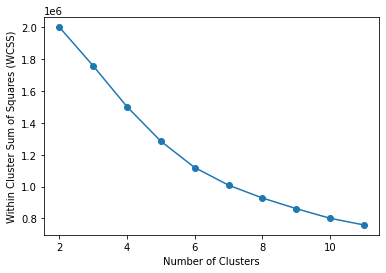

In [61]:
import matplotlib.pyplot as plt
x=np.arange(2,12)
plt.plot(x,wcss)
plt.scatter(x,wcss)
plt.ylabel("Within Cluster Sum of Squares (WCSS)")
plt.xlabel("Number of Clusters");

### Calculating Silhoutte score

In [63]:
# sil=[]
# for j in range(2,11):
#     kmeans=KMeans(n_clusters=j,init='k-means++',random_state=42)
#     kmeans.fit(X)
#     labels=kmeans.labels_
#     centroids=kmeans.cluster_centers_
#     sil.append(silhouette_score(X, labels, metric='euclidean'))

In [64]:
# x=np.arange(2,11)
# plt.plot(x,sil)
# plt.scatter(x,sil)
# plt.xlabel("Number of Clusters")
# plt.ylabel("Silhouette Score")

In [65]:
clf_final=KMeans(n_clusters=6,random_state=42,init='k-means++')

In [66]:
clf_final.fit(X)

KMeans(n_clusters=6, random_state=42)

In [67]:
final_cluster["Clusters"]=clf_final.predict(X)

In [68]:
final_cluster.head()

,Customer No.,Cust Type,Make,Model,Clean_CITY,Order Type,Total Invoices,Total Revenue,Total Servicing Hrs,Clusters
3,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Paid Service,4,10505.720000,20.744200,1
4,10,Retail,GENERAL MOTORS,OPTRA,Mumbai,Running Repairs,1,599.840000,3.071000,1
5,100,Retail,HONDA,CITY,Mumbai,Accidental,1,14167.070000,98.988000,2
6,100,Retail,HONDA,CITY,Mumbai,Paid Service,1,6632.670000,49.808000,2
7,1000,Retail,MARUTI,ALTO,Pune,Paid Service,4,7617.270000,5.224600,2


In [69]:
final_cluster.to_csv('Final_Clusters.csv')

In [70]:
cluster_excel = final_cluster.groupby(["Clusters","Cust Type"]).agg({"Total Revenue":"mean","Total Servicing Hrs":'mean',"Customer No.":"count"}).sort_values('Total Revenue')

In [71]:
final_cluster.groupby(["Clusters","Order Type"]).agg({"Total Revenue":"mean","Total Servicing Hrs":'mean',"Customer No.":"count"})

Total Revenue  Total Servicing Hrs  Customer No.
Clusters Order Type                                                         
0        Accidental        18159.921230   161.144751            6397        
         Mechanical        3576.765549    69.139437             2366        
         Paid Service      6432.088034    79.031748             15020       
         Running Repairs   3820.931472    53.280250             28892       
         SMC Redemption    1864.579746    31.537269             118         
         SMC Value Package 3476.261294    12.925159             1028        
         WBW Order         4656.066667    80.628000             3           
1        Accidental        15959.071884   152.608488            12675       
         Mechanical        3746.410372    69.100080             4839        
         Paid Service      6832.649507    64.532116             38873       
         Repeat Order      3966.740000    22.913000             1           
         Running Repairs   4470.668685    50.245725             60756       
         SMC Redemption    1961.277172    54.026846             389         
         SMC Value Package 4022.124283    7.715657              3934        
         WBW Order         6685.176667    30.728667             3           
2        Accidental        14374.628009   150.702016            11935       
         Mechanical        3418.448967    72.183186             4180        
         Paid Service      5686.913578    65.455102             33518       
         Running Repairs   3689.610239    50.529938             51791       
         SMC Redemption    1841.464601    45.416659             313         
         SMC Value Package 3661.762251    9.414344              3056        
         WBW Order         6695.668333    202.312500            6           
3        Accidental        29677.605300   318.574014            100         
         Mechanical        16937.623750   539.533192            8           
         Paid Service      31725.117305   116.462325            141         
         Running Repairs   29912.303481   139.658886            181         
         SMC Value Package 7875.192500    7.359500              4           
4        Accidental        103282.178154  1388.625246           1918        
         Mechanical        19433.775207   1622.725265           121         
         Paid Service      20980.723053   2040.826461           1035        
         Running Repairs   27850.965110   2042.901855           1043        
         SMC Redemption    3810.000000    1644.105783           3           
         SMC Value Package 7373.770000    2050.135500           4           
5        Accidental        3037303.790000 369.677184            1           
         Paid Service      2882405.470000 68.096541             2           
         Running Repairs   2754689.780000 48.493814             2

In [72]:
cluster_excel.columns = ['Avg revenue','Avg Servicing Hrs','Customer Count']

In [73]:
cluster_Excel = cluster_excel.reset_index()

In [74]:
cluster_excel.sort_values(by='Clusters')

Avg revenue  Avg Servicing Hrs  Customer Count
Clusters Cust Type                                                         
0        Retail           6231.757332    73.161700           53802         
         MFCWL            7387.954091    84.604566           22            
1        Retail           6373.356202    64.880622           121427        
         MFCWL            8095.798605    74.411786           43            
2        Insurance        4235.490000    48.615000           1             
         Retail           5527.568782    66.366455           104750        
         MFCWL            7139.742292    73.732858           48            
3        Franchise        5285.037778    184.070528          9             
         Corporate others 25047.215665   149.158144          173           
         Fleets           32319.218939   197.237289          179           
         Corporate- M&M   39126.807123   207.343598          73            
4        Retail           60924.159687   1725.477173         4124          
5        Retail           2546749.223333 175.577162          3             
         Fleets           3335623.310000 38.063204           2

In [75]:
cluster_excel.to_csv('cluster_representation.csv')

Text(0.5, 1.0, 'Scatterplot of Total Servicing Hrs and Total Revenue')

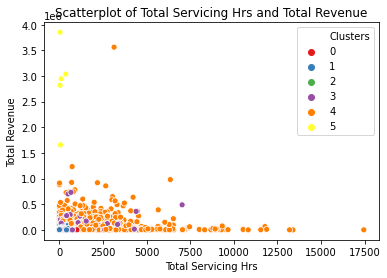

In [84]:
sns.scatterplot(x="Total Servicing Hrs", y="Total Revenue", hue="Clusters", data=final_cluster, palette="Set1")
plt.title('Scatterplot of Total Servicing Hrs and Total Revenue')

In [77]:
df.head()

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,0,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P001,1203.140000,73.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
1,1,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P002,2348.750000,6.500000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
2,2,Retail,67849,00:00:00,7005200002,168303,49317,1203.140000,GENERAL MOTORS,0.000000,SPARK,500.060000,Paid Service,2348.750000,400601,BC01,THANE,NO,0.000000,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.194100,73.000200,NaN,nan,NaN,168303.000000,P010,500.060000,1.000000,6900.760000,4051.950000,4,20000 - 50000,477.015000,20.000000,0.512000,Unprofitable,4,x
3,3,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P001,804.260000,170.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x
4,4,Retail,84419,00:00:00,7005200003,173997,78584,804.260000,TATA,197.030000,INDICA,0.000000,SMC Value Package,0.000000,400603,BC01,THANE,NO,0.000000,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.194100,73.000200,NaN,nan,NaN,173997.000000,P011,197.030000,1.000000,1198.320000,1001.290000,7,50000 - 100000,19.921000,1.000000,inf,Profitable,5,x


In [80]:
from sklearn.cluster import KMeans
def Knumber(df):
      dist=[]
      # Iterate from 1-9
      for i in range(1,10):
            # Initialize KMeans algorithm
            km=KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0)
            # Fit on data
            km.fit(df)
            # Append WCSS to list storing WCSS
            dist.append(km.inertia_)
      # Initialize figure
      fig=plt.figure( figsize=[8,5])
      # Line plot # clusters on X-axis and WCSS on Y-axis 
      plt.plot(range(1,10),dist)
      plt.show()

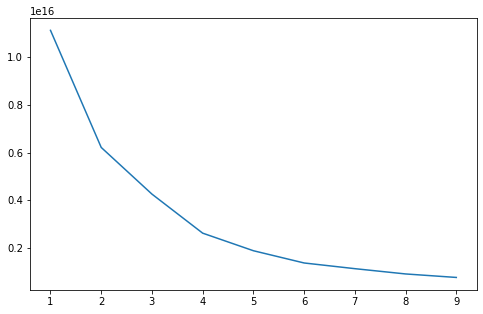

In [81]:
df1=df[['KMs Reading','Total Amt Wtd Tax.']]
Knumber(df1)

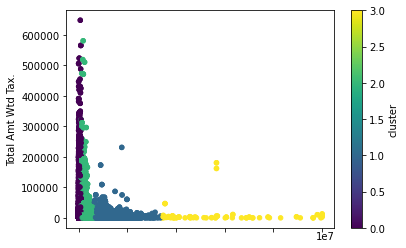

In [85]:
cluster=KMeans(n_clusters=4,init='k-means++',max_iter=300,n_init=10,random_state=0)
# create 'cluster' column
df1['cluster']=cluster.fit_predict(df1)
df1.plot.scatter('KMs Reading','Total Amt Wtd Tax.', c='cluster', cmap='viridis')
plt.show()

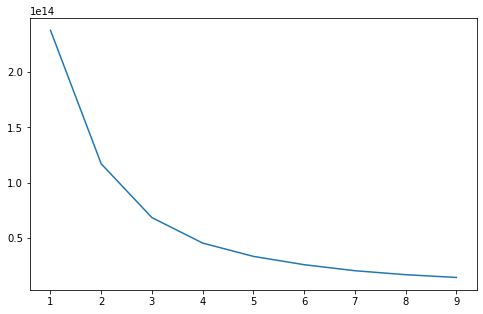

In [86]:
df2=df[['Parts Total','Total Amt Wtd Tax.']]
Knumber(df2)

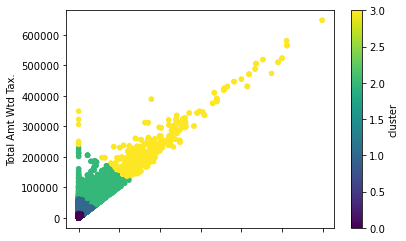

In [88]:
cluster=KMeans(n_clusters=4,init='k-means++',max_iter=300,n_init=10,random_state=0)
# create 'cluster' column
df2['cluster']=cluster.fit_predict(df2)
df2.plot.scatter('Parts Total','Total Amt Wtd Tax.', c='cluster', cmap='viridis')
plt.show()

# LTV CLUSTERING

In [ ]:
! pip install xgboost

In [ ]:
# ! pip install -U imba

In [89]:
#Importing all Required  Libraries
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import pgeocode
nomi = pgeocode.Nominatim('IN')
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split as tts,cross_val_score,ShuffleSplit
# from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score,f1_score,classification_report,roc_auc_score
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',50)

In [90]:
import matplotlib.style as style # for styling the graphss
# style.available (to know the available list of styles)
style.use('ggplot') # chosen style
plt.rc('xtick',labelsize=13) # to globally set the tick size
plt.rc('ytick',labelsize=13) # to globally set the tick size
# To display float with 2 decimal, avoid scientific printing
pd.options.display.float_format = '{:.2f}'.format
import math
#Library for one hot encoding
from sklearn.preprocessing import OneHotEncoder
#train test split
from sklearn.model_selection import train_test_split
#Evaluation metrics
from sklearn.metrics import accuracy_score,mean_squared_error,r2_score

In [91]:
invoice=df
invoice.head()

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P001,1203.14,73.00,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
1,1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P002,2348.75,6.50,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
2,2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P010,500.06,1.00,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
3,3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.00,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.19,73.00,NaN,nan,NaN,173997.00,P001,804.26,170.00,1198.32,1001.29,7,50000 - 100000,19.92,1.00,inf,Profitable,5,x
4,4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.00,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.19,73.00,NaN,nan,NaN,173997.00,P011,197.03,1.00,1198.32,1001.29,7,50000 - 100000,19.92,1.00,inf,Profitable,5,x


In [92]:
invoice[invoice['service_time_hours']<0]


,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory


In [93]:
invoice.drop(invoice.index[714423],inplace=True)

In [94]:
invoice.head()

,Unnamed: 0,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P001,1203.14,73.00,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
1,1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P002,2348.75,6.50,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
2,2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.00,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53.000000000,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.19,73.00,NaN,nan,NaN,168303.00,P010,500.06,1.00,6900.76,4051.95,4,20000 - 50000,477.01,20.00,0.51,Unprofitable,4,x
3,3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.00,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.19,73.00,NaN,nan,NaN,173997.00,P001,804.26,170.00,1198.32,1001.29,7,50000 - 100000,19.92,1.00,inf,Profitable,5,x
4,4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.00,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14.000000000,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.19,73.00,NaN,nan,NaN,173997.00,P011,197.03,1.00,1198.32,1001.29,7,50000 - 100000,19.92,1.00,inf,Profitable,5,x


### Calculation of Life Time Value for each customer over a period of 2015 (1 year) based on "Make" and "Model" of the cars

In [95]:
invoice_15=invoice[invoice["Year"]==2015]

In [96]:
invoice_15.shape

(248353, 49)

In [97]:
# Calculating frequency of visits & total revenue of a customer for calculation of ltv

customer_freq=invoice_15.groupby(["Make","Model","Clean_Location_Area","Customer No."]).agg({"Invoice No":'nunique',"Total Amt Wtd Tax.":'mean',"service_time_hours":'mean'})
customer_freq=customer_freq.reset_index()

customer_freq.head()

ltv_make_model_r=customer_freq.copy()
ltv_make_model_r["LTV"] = ltv_make_model_r["Invoice No"] * ltv_make_model_r["Total Amt Wtd Tax."]
ltv_make_model_r.head()

,Make,Model,Clean_Location_Area,Customer No.,Invoice No,Total Amt Wtd Tax.,service_time_hours,LTV
0,AUDI,A4,"Anandibazar, Ahmednagar City, Ahmednagar H.O, M.G.Udyan, Sarjepura",118262,1,1754.00,0.27,1754.00
1,AUDI,A4,"Block 5,Neyveli, Block 26,Neyveli, Block 18,Neyveli, Neyveli 3",121383,2,6126.50,55.50,12253.00
2,AUDI,A4,"Deccan Gymkhana, Film Institute, A.R. Shala",98005,1,14549.00,103.96,14549.00
3,AUDI,A4,Electronics City,113926,1,21834.00,28.31,21834.00
4,AUDI,A4,"Maravankudiyiruppu, Kottar, Irulappapuram, Edalakudy",122360,2,1049.50,1.63,2099.00


### Filtering customer having LTV/Total revenue > 0 

In [98]:
ltv_make_model_r = ltv_make_model_r[ltv_make_model_r['LTV'] > 0]

In [99]:
ltv_make_model_r.shape

(65080, 8)

### Quantile based analysis of LTV to decide threshold

In [100]:
print("0.05 quantile :-",ltv_make_model_r['LTV'].quantile(0.05))
print("0.25 quantile :-",ltv_make_model_r['LTV'].quantile(0.25))
print("0.50 quantile :-",ltv_make_model_r['LTV'].quantile(0.50))
print("0.75 quantile :-",ltv_make_model_r['LTV'].quantile(0.75))
print("0.95 quantile :-",ltv_make_model_r['LTV'].quantile(0.95))
print("minimum LTV :-",ltv_make_model_r['LTV'].min())
print("maximum LTV :-",ltv_make_model_r['LTV'].max())
print("mean LTV :-",ltv_make_model_r['LTV'].mean())

0.05 quantile :- 195.0
0.25 quantile :- 749.0
0.50 quantile :- 3036.0
0.75 quantile :- 8802.3
0.95 quantile :- 33434.4944444444
minimum LTV :- 1.0
maximum LTV :- 2109639.113122172
mean LTV :- 8740.217220340592


In [101]:
print(ltv_make_model_r[ltv_make_model_r["LTV"]<=3036.01].shape)
print(ltv_make_model_r[(ltv_make_model_r["LTV"]>3036.01)&(ltv_make_model_r["LTV"]<=8801.681363636362)].shape)
print(ltv_make_model_r[ltv_make_model_r["LTV"]>8801.681363636362].shape)

(32546, 8)
(16263, 8)
(16271, 8)


In [102]:
bins=[-1,3036.01,8801.681363636362,2109690.8168778275]
labels=["Low","Medium","High"]
ltv_make_model_r["LTV Binned"]=pd.cut(ltv_make_model_r["LTV"], bins=bins, labels=labels)

In [103]:
ltv_make_model_r["LTV Binned"].value_counts(dropna=False)

Low       32546
High      16271
Medium    16263
Name: LTV Binned, dtype: int64

In [104]:
ltv_make_model_r.dropna(inplace=True)
temp_ltv_make_model_r=ltv_make_model_r.copy()

In [105]:
le=LabelEncoder()
temp_ltv_make_model_r["Make"]=le.fit_transform(temp_ltv_make_model_r["Make"])
temp_ltv_make_model_r["Model"]=le.fit_transform(temp_ltv_make_model_r["Model"])
temp_ltv_make_model_r["LTV Binned"]=le.fit_transform(temp_ltv_make_model_r["LTV Binned"])
temp_ltv_make_model_r["Clean_Location_Area"]=le.fit_transform(temp_ltv_make_model_r["Clean_Location_Area"])

In [106]:
temp_ltv_make_model_r.head()

,Make,Model,Clean_Location_Area,Customer No.,Invoice No,Total Amt Wtd Tax.,service_time_hours,LTV,LTV Binned
0,0,7,123,118262,1,1754.00,0.27,1754.00,1
1,0,7,371,121383,2,6126.50,55.50,12253.00,0
2,0,7,582,98005,1,14549.00,103.96,14549.00,0
3,0,7,692,113926,1,21834.00,28.31,21834.00,0
4,0,7,1648,122360,2,1049.50,1.63,2099.00,1


In [107]:
p=temp_ltv_make_model_r.drop(["Customer No.","LTV","LTV Binned","Invoice No"],1)
q=temp_ltv_make_model_r["LTV Binned"]

In [108]:
temp_ltv_make_model_r['LTV Binned'].value_counts()

1    32546
0    16271
2    16263
Name: LTV Binned, dtype: int64

In [111]:
X_train,X_test,y_train,y_test=tts(p,q,test_size=0.3,random_state=0)

In [112]:
dt = DecisionTreeClassifier(criterion='entropy',max_depth=8,random_state=0)

dt.fit(X_train,y_train)

y_pred_dt = dt.predict(X_test)
y_pred_dt_train = dt.predict(X_train)

print(classification_report(y_test,y_pred_dt))


              precision    recall  f1-score   support

           0       0.97      0.63      0.77      4875
           1       0.88      0.99      0.93      9870
           2       0.68      0.75      0.71      4779

    accuracy                           0.84     19524
   macro avg       0.84      0.79      0.80     19524
weighted avg       0.85      0.84      0.84     19524



In [113]:
print("Training Accuracy :" , accuracy_score(y_test,y_pred_dt))
print("Testing Accuracy :" ,accuracy_score(y_train,y_pred_dt_train))


Training Accuracy : 0.8396844908830158
Testing Accuracy : 0.8455527263148652


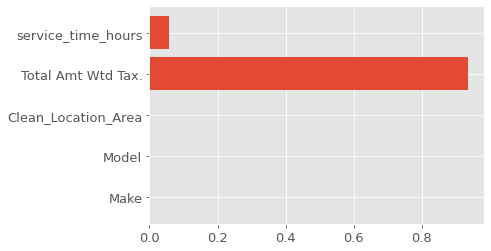

In [114]:
plt.barh(list(p),list(dt.feature_importances_))
plt.show()

In [116]:
### Cross Validation Score
dt_cv_score=cross_val_score(estimator=dt,X=p,y=q,cv=5)
print(dt_cv_score.mean())

0.832959434542102


## RANDOM FOREST CLASSIFIER

In [117]:
rfc=RandomForestClassifier(criterion='entropy',max_depth=8,random_state=0)

In [118]:
rfc.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=8, random_state=0)

In [120]:
y_pred_rfc=rfc.predict(X_test)

In [121]:
y_pred_rfc=rfc.predict(X_test)

In [122]:
accuracy_score(y_test,y_pred_rfc)

0.8442429829952879

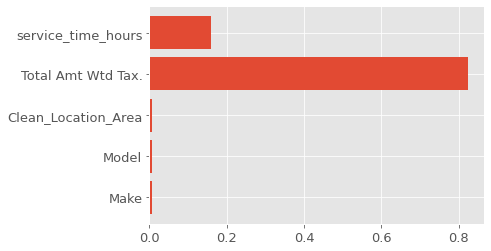

In [124]:
plt.barh(list(p),list(rfc.feature_importances_))
plt.show()

In [125]:
score=cross_val_score(estimator=rfc,X=p,y=q,cv=5)

In [126]:
score.mean()

0.8031038721573449

## XGBOOST CLASSIFIER

In [127]:
xgb=XGBClassifier()

In [128]:
xgb.fit(X_train,y_train)
y_pred_xgb=xgb.predict(X_test)

In [129]:
accuracy_score(y_test,y_pred_xgb)

0.8598647818070068

In [130]:
print(classification_report(y_test,y_pred_xgb))

              precision    recall  f1-score   support

           0       0.91      0.74      0.82      4875
           1       0.90      0.98      0.94      9870
           2       0.73      0.73      0.73      4779

    accuracy                           0.86     19524
   macro avg       0.85      0.82      0.83     19524
weighted avg       0.86      0.86      0.86     19524



In [132]:
scores_xgb=cross_val_score(estimator=xgb,X=p,y=q,cv=5)

In [133]:
scores_xgb.mean()

0.7765519360786725

## LTV REGRESSION

In [134]:
newdf=invoice 

In [135]:
df['Year'].value_counts()

2016    337169
2015    248353
2014    201456
2013    112627
2012    36668 
Name: Year, dtype: int64

In [136]:
#For Customer Life time value prediction we need data only of 2015 hence Subset the data
cltv_df=df[['Customer No.','Cust Type','Invoice No','Make','Model','Total Amt Wtd Tax.','Clean_District','Year']]

#Subsetting the data
cltv_df=cltv_df[cltv_df['Year']==2015]
cltv_df.head()

,Customer No.,Cust Type,Invoice No,Make,Model,Total Amt Wtd Tax.,Clean_District,Year
0,67849,Retail,7005200002,GENERAL MOTORS,SPARK,4051,Maharashtra,2015
1,67849,Retail,7005200002,GENERAL MOTORS,SPARK,4051,Maharashtra,2015
2,67849,Retail,7005200002,GENERAL MOTORS,SPARK,4051,Maharashtra,2015
3,84419,Retail,7005200003,TATA,INDICA,1001,Maharashtra,2015
4,84419,Retail,7005200003,TATA,INDICA,1001,Maharashtra,2015


In [137]:
#Groupby of data
cltv_group=cltv_df.groupby(['Customer No.','Cust Type','Clean_District','Make','Model']).agg({'Invoice No':'nunique','Total Amt Wtd Tax.':'mean'}).reset_index()
#cltv_group.drop('year',1,inplace=True)
cltv_group.head()

,Customer No.,Cust Type,Clean_District,Make,Model,Invoice No,Total Amt Wtd Tax.
0,10000,Retail,Telangana,MARUTI,WAGONR,1,185.00
1,100000,Retail,Gujarat,HYUNDAI,ACCENT,1,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,BOLERO,1,697.00
3,100001,Retail,Maharashtra,SKODA,SUPERB,1,1058.00
4,100001,Retail,Maharashtra,TOYOTA,INNOVA,1,2507.00


In [138]:
#finding customer value for year 2015
cltv_group['customer_value']=cltv_group['Invoice No']*cltv_group['Total Amt Wtd Tax.']
cltv_group.head()

,Customer No.,Cust Type,Clean_District,Make,Model,Invoice No,Total Amt Wtd Tax.,customer_value
0,10000,Retail,Telangana,MARUTI,WAGONR,1,185.00,185.00
1,100000,Retail,Gujarat,HYUNDAI,ACCENT,1,6026.00,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,BOLERO,1,697.00,697.00
3,100001,Retail,Maharashtra,SKODA,SUPERB,1,1058.00,1058.00
4,100001,Retail,Maharashtra,TOYOTA,INNOVA,1,2507.00,2507.00


In [139]:
#Removing Customers with zero value
zero_group=cltv_group[cltv_group['customer_value']<=0].index
cltv_group.drop(zero_group,0,inplace=True)
cltv_group.head()

,Customer No.,Cust Type,Clean_District,Make,Model,Invoice No,Total Amt Wtd Tax.,customer_value
0,10000,Retail,Telangana,MARUTI,WAGONR,1,185.00,185.00
1,100000,Retail,Gujarat,HYUNDAI,ACCENT,1,6026.00,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,BOLERO,1,697.00,697.00
3,100001,Retail,Maharashtra,SKODA,SUPERB,1,1058.00,1058.00
4,100001,Retail,Maharashtra,TOYOTA,INNOVA,1,2507.00,2507.00


In [140]:
#Creating Dataframe for Modelling 
model_df=cltv_group[['Customer No.','Cust Type','Clean_District','Make','Invoice No','Total Amt Wtd Tax.','customer_value']]
model_df.head()

,Customer No.,Cust Type,Clean_District,Make,Invoice No,Total Amt Wtd Tax.,customer_value
0,10000,Retail,Telangana,MARUTI,1,185.00,185.00
1,100000,Retail,Gujarat,HYUNDAI,1,6026.00,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,1,697.00,697.00
3,100001,Retail,Maharashtra,SKODA,1,1058.00,1058.00
4,100001,Retail,Maharashtra,TOYOTA,1,2507.00,2507.00


In [141]:
#Renaming Columns
model_df.columns=['Cust_no.','Cust','State','Make','Count_invoice','Avg_revenue','customer_value']
model_df.head()

,Cust_no.,Cust,State,Make,Count_invoice,Avg_revenue,customer_value
0,10000,Retail,Telangana,MARUTI,1,185.00,185.00
1,100000,Retail,Gujarat,HYUNDAI,1,6026.00,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,1,697.00,697.00
3,100001,Retail,Maharashtra,SKODA,1,1058.00,1058.00
4,100001,Retail,Maharashtra,TOYOTA,1,2507.00,2507.00


In [142]:
#Renaming Columns
model_df.columns=['Cust_no.','Cust','State','Make','Count_invoice','Avg_revenue','customer_value']
model_df.head()

,Cust_no.,Cust,State,Make,Count_invoice,Avg_revenue,customer_value
0,10000,Retail,Telangana,MARUTI,1,185.00,185.00
1,100000,Retail,Gujarat,HYUNDAI,1,6026.00,6026.00
2,100001,Retail,Maharashtra,MAHINDRA,1,697.00,697.00
3,100001,Retail,Maharashtra,SKODA,1,1058.00,1058.00
4,100001,Retail,Maharashtra,TOYOTA,1,2507.00,2507.00


In [143]:
#Final dummyencoded dataframe
A=pd.get_dummies(data=model_df, columns=['Cust', 'State','Make'])

In [144]:
final_df=pd.DataFrame(A)
final_df.drop('Cust_no.',1,inplace=True)
final_df.head()

,Count_invoice,Avg_revenue,customer_value,Cust_Corporate others,Cust_Corporate- M&M,Cust_Fleets,Cust_Insurance,Cust_MFCWL,Cust_Retail,State_Andhra Pradesh,State_Bihar,State_Chandigarh,State_Chattisgarh,State_Dadra and Nagar Haveli and Daman and Diu,State_Delhi,State_Goa,State_Gujarat,State_Haryana,State_Himachal Pradesh,State_Jammu & Kashmir,State_Jharkhand,State_Karnataka,State_Kerala,State_Lakshadweep,State_Madhya Pradesh,State_Maharashtra,State_Pondicherry,State_Punjab,State_Rajasthan,State_Tamil Nadu,State_Telangana,State_Uttar Pradesh,State_Uttarakhand,State_West Bengal,Make_AUDI,Make_BMW,Make_DAEWOO,Make_FIAT,Make_FORCE,Make_FORD,Make_GENERAL MOTORS,Make_HINDUSTAN MOTORS,Make_HONDA,Make_HYUNDAI,Make_JEEP,Make_MAHINDRA,Make_MARUTI,Make_MERCEDES-BENZ,Make_MITSUBISHI MOTOR,Make_NISSAN,Make_PORSCHE,Make_PREMIER AUTOMOBILES,Make_RENAULT,Make_ROVER,Make_SKODA,Make_SONALIKA,Make_TATA,Make_TOYOTA,Make_VOLKSWAGEN,Make_VOLVO
0,1,185.00,185.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,6026.00,6026.00,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,697.00,697.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,1058.00,1058.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1,2507.00,2507.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [145]:
#Train Test Split 
X=final_df.drop('customer_value',1)
y=final_df['customer_value']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=9)

## DECISION TREE REGRESSOR

In [146]:
#Implementing Decison Tree Regressor
from sklearn.tree import DecisionTreeRegressor

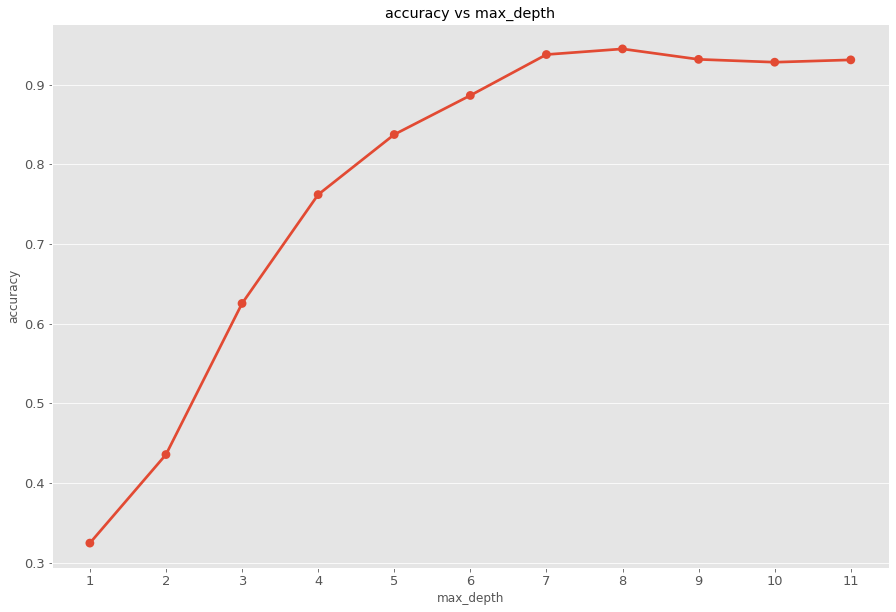

In [147]:
#Finding the Optimal Value For Max Depth
max_depth_range = list(range(1,12))
# List to store the average RMSE for each value of max_depth:
accuracy = []
for depth in max_depth_range:
    
    reg = DecisionTreeRegressor(max_depth = depth, random_state = 18)
    reg.fit(X_train, y_train)
    score = reg.score(X_test, y_test)
    accuracy.append(score)
    
a=max_depth_range
b=accuracy

plt.figure(figsize=(15,10))
sns.pointplot(a,b)
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('accuracy vs max_depth')
plt.show()

In [148]:
#Applying  Decision Tree Regressor
X=final_df.drop('customer_value',1)
y=final_df['customer_value']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=18)
dt_reg = DecisionTreeRegressor(max_depth=10, random_state = 18)
dt_reg.fit(X_train, y_train)
y_pred=dt_reg.predict(X_test)
#Evaluation metric
mse =mean_squared_error(y_test,y_pred)
print('mse score:',mse)
print('=='*100)
rmse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(rmse)
print('Rmse score:',rmse)

#accuracy score on train data
train_score=dt_reg.score(X_train,y_train)
print('train score:',train_score)
print('=='*100)

#accuracy score on test data
test_score=dt_reg.score(X_test,y_test)
print('test score:',test_score)
print('=='*100)


mse score: 34463796.89726805
Rmse score: 5870.587440560616
train score: 0.9983772333938793
test score: 0.9137064689501142


In [149]:
#Evaluation metric  R2 score
R2_Score=r2_score(y_test,y_pred)
print('R2 score:',R2_Score)
print('=='*100)

R2 score: 0.9137064689501142


In [150]:
# Importing Invoice data

In [151]:
invoice_org = pd.read_csv('Final_invoice.csv')

In [152]:
invoice_org.head()

,Unnamed: 0,Amt Rcvd From Custom,Amt Rcvd From Ins Co,Area / Locality,CGST(14%),CGST(2.5%),CGST(6%),CGST(9%),CITY,Cash /Cashless Type,Claim No.,Cust Type,Customer No.,District,Expiry Date,Gate Pass Date,Gate Pass Time,IGST(12%),IGST(18%),IGST(28%),IGST(5%),Insurance Company,Invoice Date,Invoice No,Invoice Time,Job Card No,JobCard Date,JobCard Time,KMs Reading,Labour Total,Make,Misc Total,Model,ODN No.,OSL Total,Order Type,Outstanding Amt,Parts Total,Pin code,Plant,Plant Name1,Policy no.,Print Status,Recovrbl Exp,Regn No,SGST/UGST(14%),SGST/UGST(2.5%),SGST/UGST(6%),SGST/UGST(9%),Service Advisor Name,TDS amount,Technician Name,Total Amt Wtd Tax.,Total CGST,Total GST,Total IGST,Total SGST/UGST,Total Value,User ID
0,0,0.00,0.00,MAJIWADA,0.00,0.00,0.00,0.00,Thane,NaN,NaN,Retail,67849,Maharashtra,NaN,NaN,00:00:00,0.00,0.00,0.00,0.00,NaN,2015-01-02,7005200002,11:30:36,168303,2014-12-13,14:29:43,49317,1203.14,GENERAL MOTORS,0.00,SPARK,7005200002.00,500.06,Paid Service,0.00,2348.75,400601,BC01,THANE,NaN,NO,0.00,KA19MA1291,0.00,0.00,0.00,0.00,nan,0.00,RUPESH,4051.95,0.00,0.00,0.00,0.00,4051.95,BC01FS1
1,1,0.00,0.00,THNAE,0.00,0.00,0.00,0.00,THNAE,NaN,NaN,Retail,84419,Maharashtra,NaN,NaN,00:00:00,0.00,0.00,0.00,0.00,NaN,2015-01-03,7005200003,10:07:32,173997,2015-01-02,14:12:18,78584,804.26,TATA MOTORS,197.03,INDICA,7005200003.00,0.00,SMC Value Package,0.00,0.00,400603,BC01,THANE,NaN,NO,0.00,MH43R3046,0.00,0.00,0.00,0.00,nan,0.00,PRASHANT,1001.29,0.00,0.00,0.00,0.00,1001.29,BC01SA2
2,2,0.00,0.00,THANE,0.00,0.00,0.00,0.00,THANE[W],NaN,NaN,Retail,81055,Maharashtra,NaN,NaN,00:00:00,0.00,0.00,0.00,0.00,NaN,2015-01-03,7005200004,11:12:57,173889,2015-01-02,11:40:44,33985,180.19,MARUTI SUZUKI,0.00,ZEN,7005200004.00,0.00,Running Repairs,0.00,52.95,400607,BC01,THANE,NaN,NO,0.00,AP09AX0582,0.00,0.00,0.00,0.00,nan,0.00,IMRAN,233.14,0.00,0.00,0.00,0.00,233.14,BC01SA2
3,3,0.00,0.00,THNAE,0.00,0.00,0.00,0.00,THNAE,NaN,NaN,Retail,84419,Maharashtra,NaN,NaN,00:00:00,0.00,0.00,0.00,0.00,NaN,2015-01-03,7005200005,11:40:44,174158,2015-01-03,10:12:32,78584,0.00,TATA MOTORS,0.00,INDICA,7005200005.00,0.00,SMC Redemption,0.00,0.00,400603,BC01,THANE,NaN,NO,0.00,MH43R3046,0.00,0.00,0.00,0.00,nan,0.00,PRASHANT,0.00,0.00,0.00,0.00,0.00,0.00,BC01SA2
4,4,0.00,0.00,THANE,0.00,0.00,0.00,0.00,THANE,NaN,NaN,Retail,18980,Maharashtra,NaN,NaN,00:00:00,0.00,0.00,0.00,0.00,NaN,2015-01-03,7005200006,12:07:17,173860,2015-01-02,10:45:42,50057,1202.97,HYUNDAI,100.00,SANTRO XING,7005200006.00,499.99,Paid Service,0.00,944.16,400603,BC01,THANE,NaN,NO,0.00,MH04CD9768,0.00,0.00,0.00,0.00,nan,0.00,DAYANAND,2747.12,0.00,0.00,0.00,0.00,2747.12,BC01SA2


In [153]:
print('Invoice', invoice_org.shape)

Invoice (492314, 59)


# RFM ANALYSIS

RFM is a method used for analyzing customer value. RFM stands for the three dimensions:

Recency – How recently did the customer purchase?

Frequency – How often do they purchase?

Monetary Value – How much do they spend?


In [154]:
tx_data = invoice_org[['Customer No.','Invoice Date','Total Amt Wtd Tax.']]
tx_data['Invoice Date'] = pd.to_datetime(tx_data['Invoice Date'])
tx_data.rename(columns={"Customer No.": "CustomerID", "Invoice Date": "InvoiceDate",
                       'Total Amt Wtd Tax.': "Revenue"},inplace= True)

In [155]:
#creating YearMonth field for the ease of reporting and visualization
tx_data['InvoiceYearMonth'] = tx_data['InvoiceDate'].map(lambda date: 100*date.year + date.month)
tx_data.sample(5)

,CustomerID,InvoiceDate,Revenue,InvoiceYearMonth
297029,147049,2016-01-01,149.39,201601
105110,85110,2015-11-12,1664.03,201511
277371,5902,2013-10-21,1460.33,201310
10655,25857,2015-02-06,0.00,201502
197609,73401,2014-10-08,3250.28,201410


In [156]:
tx_uk = tx_data

In [157]:
tx_revenue = tx_data.groupby(['InvoiceYearMonth'])['Revenue'].sum().reset_index()

In [159]:
#X and Y axis inputs for Plotly graph. We use Scatter for line graphs
plot_data = [
    go.Scatter(
        x=tx_revenue['InvoiceYearMonth'],
        y=tx_revenue['Revenue'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Montly Revenue'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

- This clearly shows our revenue is growing especially Aug ‘15 onwards  let’s figure out what is our Monthly Revenue Growth Rate:

In [160]:
#using pct_change() function to see monthly percentage change
tx_revenue['MonthlyGrowth'] = tx_revenue['Revenue'].pct_change()

#showing first 5 rows
tx_revenue.head()

#visualization - line graph
plot_data = [
    go.Scatter(
        x=tx_revenue.query("InvoiceYearMonth < 201410")['InvoiceYearMonth'],
        y=tx_revenue.query("InvoiceYearMonth < 201410")['MonthlyGrowth'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Montly Growth Rate'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

# Monthly Active Customers
To see the details Monthly Active Customers, we will follow the steps we exactly did for Monthly Revenue.

In [161]:
#creating monthly active customers dataframe by counting unique Customer IDs
tx_monthly_active = tx_uk.groupby('InvoiceYearMonth')['CustomerID'].nunique().reset_index()


#plotting the output
plot_data = [
    go.Bar(
        x=tx_monthly_active['InvoiceYearMonth'],
        y=tx_monthly_active['CustomerID'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Active Customers'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

- New Customer Ratio: a good indicator of if we are losing our existing customers or unable to attract new ones
- Retention Rate: King of the metrics. Indicates how many customers we retain over specific time window. We will be showing examples for monthly retention rate and cohort based retention rate.

# New Customer Ratio
First we should define what is a new customer. In our dataset, we can assume a new customer is whoever did his/her first purchase in the time window we defined. We will do it monthly for this example.
We will be using .min() function to find our first purchase date for each customer and define new customers based on that.

In [162]:
#create a dataframe contaning CustomerID and first purchase date
tx_min_purchase = tx_uk.groupby('CustomerID').InvoiceDate.min().reset_index()
tx_min_purchase.columns = ['CustomerID','MinPurchaseDate']
tx_min_purchase['MinPurchaseYearMonth'] = tx_min_purchase['MinPurchaseDate'].map(lambda date: 100*date.year + date.month)

#merge first purchase date column to our main dataframe (tx_uk)
tx_uk = pd.merge(tx_uk, tx_min_purchase, on='CustomerID')

tx_uk.head()

,CustomerID,InvoiceDate,Revenue,InvoiceYearMonth,MinPurchaseDate,MinPurchaseYearMonth
0,67849,2015-01-02,4051.95,201501,2014-08-14,201408
1,67849,2014-08-14,11470.10,201408,2014-08-14,201408
2,67849,2014-08-16,28344.28,201408,2014-08-14,201408
3,67849,2014-10-09,200.00,201410,2014-08-14,201408
4,67849,2014-12-31,30458.92,201412,2014-08-14,201408


In [163]:
#create a column called User Type and assign Existing 
#if User's First Purchase Year Month before the selected Invoice Year Month
tx_uk['UserType'] = 'New'
tx_uk.loc[tx_uk['InvoiceYearMonth']>tx_uk['MinPurchaseYearMonth'],'UserType'] = 'Existing'
tx_uk.head()

,CustomerID,InvoiceDate,Revenue,InvoiceYearMonth,MinPurchaseDate,MinPurchaseYearMonth,UserType
0,67849,2015-01-02,4051.95,201501,2014-08-14,201408,Existing
1,67849,2014-08-14,11470.10,201408,2014-08-14,201408,New
2,67849,2014-08-16,28344.28,201408,2014-08-14,201408,New
3,67849,2014-10-09,200.00,201410,2014-08-14,201408,Existing
4,67849,2014-12-31,30458.92,201412,2014-08-14,201408,Existing


In [164]:
#calculate the Revenue per month for each user type
tx_user_type_revenue = tx_uk.groupby(['InvoiceYearMonth','UserType'])['Revenue'].sum().reset_index()
tx_user_type_revenue.head()

,InvoiceYearMonth,UserType,Revenue
0,201204,New,8076962.23
1,201205,Existing,2560510.45
2,201205,New,6161656.50
3,201206,Existing,2833539.53
4,201206,New,6763790.16


In [165]:
#filtering the dates and plot the result
tx_user_type_revenue = tx_user_type_revenue.query("InvoiceYearMonth != 201204 and InvoiceYearMonth != 201610")
plot_data = [
    go.Scatter(
        x=tx_user_type_revenue.query("UserType == 'Existing'")['InvoiceYearMonth'],
        y=tx_user_type_revenue.query("UserType == 'Existing'")['Revenue'],
        name = 'Existing'
    ),
    go.Scatter(
        x=tx_user_type_revenue.query("UserType == 'New'")['InvoiceYearMonth'],
        y=tx_user_type_revenue.query("UserType == 'New'")['Revenue'],
        name = 'New'
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='New vs Existing'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Existing customers are showing a positive trend and tell us that our customer base is growing

# Let’s have a better view by looking at the New Customer Ratio:

In [166]:
#create a dataframe that shows new user ratio - we also need to drop NA values (first month new user ratio is 0)
tx_user_ratio = tx_uk.query("UserType == 'New'").groupby(['InvoiceYearMonth'])['CustomerID'].nunique()/tx_uk.query("UserType == 'Existing'").groupby(['InvoiceYearMonth'])['CustomerID'].nunique() 
tx_user_ratio = tx_user_ratio.reset_index()
tx_user_ratio = tx_user_ratio.dropna()

#print the dafaframe
tx_user_ratio.head()

,InvoiceYearMonth,CustomerID
1,201205,7.89
2,201206,4.59
3,201207,3.16
4,201208,2.06
5,201209,1.77


In [167]:
#plot the result

plot_data = [
    go.Bar(
        x=tx_user_ratio.query("InvoiceYearMonth>201205 and InvoiceYearMonth<201610")['InvoiceYearMonth'],
        y=tx_user_ratio.query("InvoiceYearMonth>201205 and InvoiceYearMonth<201610")['CustomerID'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='New Customer Ratio'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### New Customer Ratio has declined 
Monthly Retention Rate
Retention rate should be monitored very closely because it indicates how sticky is your service and how well your product fits the market. For making Monthly Retention Rate visualized, we need to calculate how many customers retained from previous month.
Monthly Retention Rate = Retained Customers From Prev. Month/Active Customers Total

In [168]:
#identify which users are active by looking at their revenue per month
tx_user_purchase = tx_uk.groupby(['CustomerID','InvoiceYearMonth'])['Revenue'].sum().reset_index()

#create retention matrix with crosstab
tx_retention = pd.crosstab(tx_user_purchase['CustomerID'], tx_user_purchase['InvoiceYearMonth']).reset_index()

tx_retention.head()

InvoiceYearMonth,CustomerID,201204,201205,201206,201207,201208,201209,201210,201211,201212,201301,201302,201303,201304,201305,201306,201307,201308,201309,201310,201311,201312,201401,201402,201403,201404,201405,201406,201407,201408,201409,201410,201411,201412,201501,201502,201503,201504,201505,201506,201507,201508,201509,201510,201511,201512,201601,201602,201603,201604,201605,201606,201607,201608,201609,201610
0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,10,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,10000,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [169]:
#create an array of dictionary which keeps Retained & Total User count for each month
months = tx_retention.columns[2:]
retention_array = []
for i in range(len(months)-1):
    retention_data = {}
    selected_month = months[i+1]
    prev_month = months[i]
    retention_data['InvoiceYearMonth'] = int(selected_month)
    retention_data['TotalUserCount'] = tx_retention[selected_month].sum()
    retention_data['RetainedUserCount'] = tx_retention[(tx_retention[selected_month]>0) & (tx_retention[prev_month]>0)][selected_month].sum()
    retention_array.append(retention_data)

In [170]:
#convert the array to dataframe and calculate Retention Rate
tx_retention = pd.DataFrame(retention_array)
tx_retention['RetentionRate'] = tx_retention['RetainedUserCount']/tx_retention['TotalUserCount']

#plot the retention rate graph
plot_data = [
    go.Scatter(
        x=tx_retention.query("InvoiceYearMonth<201610")['InvoiceYearMonth'],
        y=tx_retention.query("InvoiceYearMonth<201610")['RetentionRate'],
        name="organic"
    )
    
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Retention Rate'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)


# Recency
To calculate recency, we need to find out most recent purchase date of each customer and see how many days they are inactive for. After having no. of inactive days for each customer, we will apply K-means* clustering to assign customers a recency score.

In [171]:
tx_uk = tx_data

In [172]:
tx_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 492314 entries, 0 to 492313
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   CustomerID        492314 non-null  object        
 1   InvoiceDate       492314 non-null  datetime64[ns]
 2   Revenue           492314 non-null  float64       
 3   InvoiceYearMonth  492314 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 15.0+ MB


In [173]:
#create a generic user dataframe to keep CustomerID and new segmentation scores
tx_user = pd.DataFrame(tx_data['CustomerID'].unique())
tx_user.columns = ['CustomerID']

#get the max purchase date for each customer and create a dataframe with it
tx_max_purchase = tx_uk.groupby('CustomerID').InvoiceDate.max().reset_index()
tx_max_purchase.columns = ['CustomerID','MaxPurchaseDate']

#we take our observation point as the max invoice date in our dataset
tx_max_purchase['Recency'] = (tx_max_purchase['MaxPurchaseDate'].max() - tx_max_purchase['MaxPurchaseDate']).dt.days

In [174]:
#merge this dataframe to our new user dataframe
tx_user = pd.merge(tx_user, tx_max_purchase[['CustomerID','Recency']], on='CustomerID')
tx_user.head()

,CustomerID,Recency
0,67849,668
1,84419,322
2,81055,319
3,18980,323
4,84457,254


In [175]:
#plot a recency histogram

plot_data = [
    go.Histogram(
        x=tx_user['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [176]:
tx_user.describe()

,Recency
count,253484.00
mean,427.90
std,401.08
min,0.00
25%,97.00
50%,281.00
75%,684.00
max,1673.00


### We see that even though the average is 427 day recency, median is 281

# Applying K-means clustering to assign a recency score

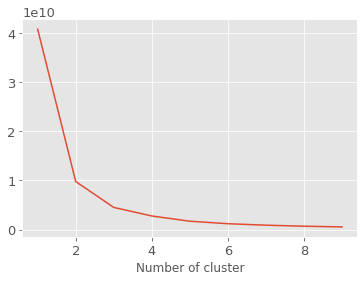

In [177]:
from sklearn.cluster import KMeans

sse={}
tx_recency = tx_user[['Recency']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_recency)
    tx_recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [178]:
#build 4 clusters for recency and add it to dataframe
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Recency']])
tx_user['RecencyCluster'] = kmeans.predict(tx_user[['Recency']])

#function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

tx_user = order_cluster('RecencyCluster', 'Recency',tx_user,False)

In [179]:
tx_user.sample(5)

,CustomerID,Recency,RecencyCluster
119091,137719,93,3
112865,116325,125,3
166385,203711,122,3
61061,101095,390,2
121470,83828,273,3


In [180]:
#see details of each cluster
tx_user.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,22619.00,1286.25,157.20,1081.00,1154.00,1249.00,1396.00,1673.00
1,42950.00,874.23,121.69,667.00,766.00,880.00,979.00,1080.00
2,60624.00,455.80,110.36,284.00,357.00,451.00,550.00,666.00
3,127291.00,111.49,80.77,0.00,40.00,98.00,174.00,283.00


In [181]:
tx_user.RecencyCluster.value_counts()

3    127291
2    60624 
1    42950 
0    22619 
Name: RecencyCluster, dtype: int64

# Frequency

In [182]:
temp = tx_user

In [183]:
#get order counts for each user and create a dataframe with it
tx_frequency = tx_uk.groupby('CustomerID').InvoiceDate.count().reset_index()
tx_frequency.columns = ['CustomerID','Frequency']

#add this data to our main dataframe
tx_user = pd.merge(tx_user, tx_frequency, on='CustomerID')
tx_user.sample(5)

,CustomerID,Recency,RecencyCluster,Frequency
90356,132649,371,2,1
44163,86287,539,2,2
111263,107862,103,3,5
13341,52262,946,1,2
3736,31296,744,1,4


In [184]:
tx_user.Frequency.nunique()

77

In [185]:
#plot the histogram
plot_data = [
    go.Histogram(
        x=tx_user.query('Frequency < 30')['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [186]:
#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Frequency']])
tx_user['FrequencyCluster'] = kmeans.predict(tx_user[['Frequency']])

#order the frequency cluster
tx_user = order_cluster('FrequencyCluster', 'Frequency',tx_user,True)

#see details of each cluster
tx_user.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,235560.00,1.50,0.83,1.00,1.00,1.00,2.00,4.00
1,17916.00,7.38,4.76,5.00,5.00,6.00,8.00,157.00
2,7.00,429.57,161.59,251.00,328.50,360.00,525.50,688.00
3,1.00,2668.00,nan,2668.00,2668.00,2668.00,2668.00,2668.00


# Revenue / monetary
Let’s see how our customer database looks like when we cluster them based on revenue. We will calculate revenue for each customer, plot a histogram and apply the same clustering method.

In [187]:
temp2 = tx_uk

In [188]:
#calculate revenue for each customer
tx_revenue = tx_uk.groupby('CustomerID').Revenue.sum().reset_index()

#merge it with our main dataframe
tx_user = pd.merge(tx_user, tx_revenue, on='CustomerID')
tx_user.sample(5)

,CustomerID,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue
20707,42744,1015,1,1,0,1604.45
19872,41835,954,1,2,0,347.98
31932,54500,933,1,2,0,9919.63
57210,38375,1044,1,1,0,249.22
205149,243493,35,3,1,0,574.74


In [189]:
#plot the histogram
plot_data = [
    go.Histogram(
        x=tx_user.query('Revenue < 10000')['Revenue']
    )
]

plot_layout = go.Layout(
        title='Monetary Value'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

# We have some customers with negative revenue as well. Let’s continue and apply k-means clustering:

In [191]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Revenue']])
tx_user['RevenueCluster'] = kmeans.predict(tx_user[['Revenue']])


#order the cluster numbers
tx_user = order_cluster('RevenueCluster', 'Revenue',tx_user,True)

#show details of the dataframe
tx_user.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,246052.00,5886.12,8551.19,-0.01,478.23,2412.72,7323.34,48328.99
1,7411.00,91091.46,58696.41,48330.52,57116.78,71106.62,100302.34,657705.63
2,20.00,1424063.18,731390.92,854562.73,918410.61,1097349.18,1655018.16,3801248.91
3,1.00,11859728.34,nan,11859728.34,11859728.34,11859728.34,11859728.34,11859728.34


# Creating over all score

In [192]:
#calculate overall score and use mean() to see details
tx_user['OverallScore'] = tx_user['RecencyCluster'] + tx_user['FrequencyCluster'] + tx_user['RevenueCluster']
tx_user.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()

,Recency,Frequency,Revenue
OverallScore,,,
0,1287.37,1.37,4922.56
1,883.76,1.58,5786.04
2,476.96,1.71,7016.30
3,129.44,1.72,6515.16
4,141.18,6.16,39384.12
5,113.86,10.82,96751.91
6,62.45,102.82,1208959.28
7,91.00,445.67,1874072.07
9,48.00,2668.00,11859728.34


In [193]:
tx_user['Segment'] = 'Low-Value'
tx_user.loc[tx_user['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_user.loc[tx_user['OverallScore']>4,'Segment'] = 'High-Value'

In [194]:
tx_user.Segment.value_counts()

Mid-Value     132379
Low-Value     119313
High-Value    1792  
Name: Segment, dtype: int64

In [195]:
tx_user.to_csv('rfm.csv',index = False)

In [196]:
tx_user = pd.read_csv('rfm.csv')

In [197]:
tx_user.shape

(253484, 9)

In [198]:
tx_user.Segment.value_counts()

Mid-Value     132379
Low-Value     119313
High-Value    1792  
Name: Segment, dtype: int64

In [199]:
class0 = tx_user[tx_user["Segment"] == 'Mid-Value'].sample(n = 900)
class1 = tx_user[tx_user["Segment"] == 'Low-Value'].sample(n = 900)
class2 = tx_user[tx_user["Segment"] == 'High-Value'].sample(n = 900)
tx_user = pd.concat([class0, class1, class2])

In [200]:
class2.sample(5)

,CustomerID,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
2789,148484,101,3,7,1,97180.24,1,5,High-Value
1862,94286,117,3,11,1,66557.28,1,5,High-Value
2284,113909,247,3,5,1,48946.51,1,5,High-Value
2496,118639,202,3,5,1,148222.83,1,5,High-Value
1753,63490,142,3,11,1,65120.56,1,5,High-Value


In [201]:
tx_user.shape

(2700, 9)

In [202]:
tx_user.Segment.value_counts()

Mid-Value     900
Low-Value     900
High-Value    900
Name: Segment, dtype: int64

# Let’s see how our segments distributed on a scatter plot:

In [203]:
#Revenue vs Frequency
tx_graph = tx_user.query("Revenue < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Revenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Revenue'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'High-Value'")['Revenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Revenue"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [204]:
#Revenue Recency

tx_graph = tx_user.query("Revenue < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Revenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Revenue'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['Revenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Revenue"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [205]:
# Revenue vs Frequency
tx_graph = tx_user.query("Revenue < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Frequency'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

High Value: Improve Retention, 

Mid Value: Improve Retention + Increase Frequency,

Low Value: Increase Frequency

In [206]:
tx_user.sample(5)

,CustomerID,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
31111,49649,970,1,1,0,148.58,0,1,Low-Value
226138,197440,138,3,2,0,9069.47,0,3,Mid-Value
65802,86364,654,2,1,0,0.00,0,2,Low-Value
19006,132630,72,3,13,1,44790.07,0,4,Mid-Value
1908,E27071,2,3,17,1,83198.90,1,5,High-Value


In [207]:
# Calculate average values for each RFM_Level, and return a size of each segment 
rfm_level_agg = tx_user.groupby('Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Revenue': ['mean', 'count']
}).round(1)
# Print the aggregated dataset
print(rfm_level_agg)

           Recency Frequency   Revenue      
              mean      mean      mean count
Segment                                     
High-Value 111.30  16.90     131822.00  900 
Low-Value  748.50  1.70      6688.90    900 
Mid-Value  134.40  2.10      9029.20    900 


In [210]:
!pip install squarify

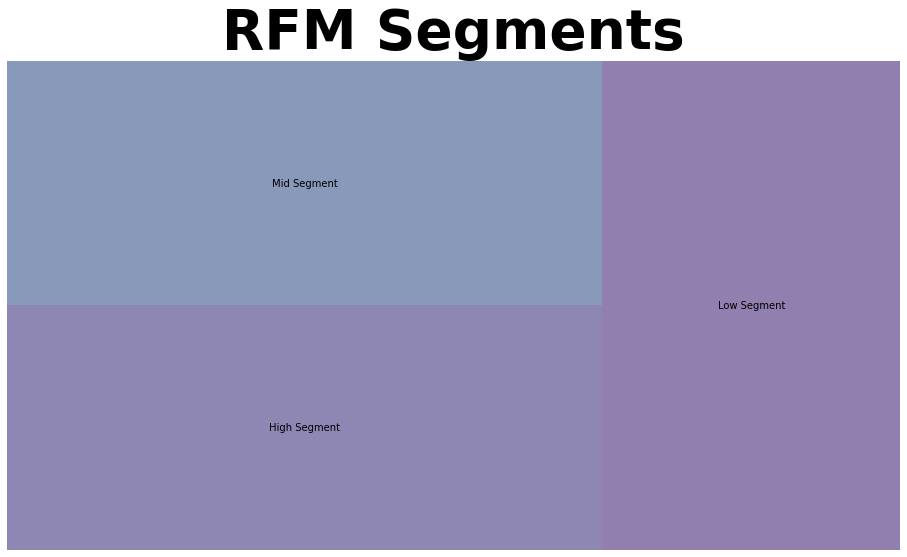

In [211]:
import squarify
# rfm_level_agg.columns = rfm_level_agg.columns.droplevel()
rfm_level_agg.columns = ['RecencyMean','FrequencyMean','RevenueMean', 'Count']
#Create our plot and resize it.
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(16, 9)
squarify.plot(sizes=rfm_level_agg['Count'], 
              label=['High Segment',
                     'Mid Segment',
                     'Low Segment'], alpha=.6 )
plt.title("RFM Segments",fontsize=55,fontweight="bold")
plt.axis('off')
plt.show()